## CatBoost-Ax　のサンプルコード（train, valid, test使用）

In [1]:
%load_ext lab_black

In [2]:
# ライブラリーのインポート
import os

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
from ax.utils.notebook.plotting import render, init_notebook_plotting

%matplotlib inline

# ボストンの住宅価格データ
from sklearn.datasets import load_boston

# 前処理
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# CatBoost
import catboost as cb
from catboost import CatBoost, Pool

# Ax
import ax
from ax import (
    ParameterType,
    RangeParameter,
    ChoiceParameter,
    SearchSpace,
    SimpleExperiment,
    modelbridge,
    models,
)

# 評価指標
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=pd.core.common.SettingWithCopyWarning)

In [3]:
print(cb.__version__)

0.26


In [4]:
print(ax.__version__)

0.2.0


In [5]:
# データセットの読込み
boston = load_boston()

# 説明変数の格納
df = pd.DataFrame(boston.data, columns=boston.feature_names)
# 目的変数の追加
df["MEDV"] = boston.target

# データの中身を確認
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


#### 前処理

In [6]:
# ランダムシード値
RANDOM_STATE = 10

# 学習データと評価データの割合
TEST_SIZE = 0.2

# 学習データと評価データを作成
x_train, x_test, y_train, y_test = train_test_split(
    df.iloc[:, 0 : df.shape[1] - 1],
    df.iloc[:, df.shape[1] - 1],
    test_size=TEST_SIZE,
    random_state=RANDOM_STATE,
)

# trainのデータセットの2割をモデル学習時のバリデーションデータとして利用する
x_train, x_valid, y_train, y_valid = train_test_split(
    x_train, y_train, test_size=TEST_SIZE, random_state=RANDOM_STATE
)

In [7]:
search_space = SearchSpace(
    parameters=[
        RangeParameter(
            name="iterations",
            parameter_type=ParameterType.INT,
            lower=50,
            upper=300,
            log_scale=False,
        ),
        RangeParameter(
            name="depth",
            parameter_type=ParameterType.INT,
            lower=4,
            upper=10,
            log_scale=False,
        ),
        RangeParameter(
            name="learning_rate",
            parameter_type=ParameterType.FLOAT,
            lower=0.01,
            upper=0.3,
            log_scale=True,
        ),
        RangeParameter(
            name="random_strength",
            parameter_type=ParameterType.INT,
            lower=0,
            upper=100,
            log_scale=False,
        ),
        RangeParameter(
            name="bagging_temperature",
            parameter_type=ParameterType.FLOAT,
            lower=0.01,
            upper=100.0,
            log_scale=True,
        ),
        ChoiceParameter(
            name="od_type",
            parameter_type=ParameterType.STRING,
            values=["IncToDec", "Iter"],
        ),
        RangeParameter(
            name="od_wait",
            parameter_type=ParameterType.INT,
            lower=10,
            upper=50,
            log_scale=False,
        ),
    ]
)

In [8]:
def evaluation_function(parameterization, weight=None):

    model = cb.CatBoostRegressor(
        iterations=parameterization["iterations"],
        depth=parameterization["depth"],
        learning_rate=parameterization["learning_rate"],
        random_strength=parameterization["random_strength"],
        bagging_temperature=parameterization["bagging_temperature"],
        od_type=parameterization["od_type"],
        od_wait=parameterization["od_wait"],
    )

    model.fit(
        x_train,
        y_train,
        eval_set=[(x_valid, y_valid)],
        early_stopping_rounds=50,
        verbose=False,
    )

    preds = model.predict(x_valid)
    mae = mean_absolute_error(y_valid, preds)

    return mae

In [9]:
%%time
# Axで最適値を見つける
exp = SimpleExperiment(name="test_CatBoost",
                       search_space=search_space,
                       evaluation_function=evaluation_function,
                       minimize=True,
                       objective_name="mae"
                      )

# ベイズ最適化
sobol = modelbridge.get_sobol(search_space=exp.search_space, seed=RANDOM_STATE)
print(f"Running Sobol initialization trials...")

for _ in range(5):
    exp.new_trial(generator_run=sobol.gen(1))
for i in range(15):
    print(f"Running GP+EI optimization tiral {i+1}...")
    gpei=modelbridge.get_GPEI(experiment=exp, data=exp.eval())
    exp.new_trial(generator_run=gpei.gen(1))

Running Sobol initialization trials...
Running GP+EI optimization tiral 1...
Running GP+EI optimization tiral 2...
Running GP+EI optimization tiral 3...
Running GP+EI optimization tiral 4...
Running GP+EI optimization tiral 5...
Running GP+EI optimization tiral 6...
Running GP+EI optimization tiral 7...
Running GP+EI optimization tiral 8...
Running GP+EI optimization tiral 9...
Running GP+EI optimization tiral 10...
Running GP+EI optimization tiral 11...
Running GP+EI optimization tiral 12...
Running GP+EI optimization tiral 13...
Running GP+EI optimization tiral 14...
Running GP+EI optimization tiral 15...
CPU times: user 2min 18s, sys: 1min 19s, total: 3min 37s
Wall time: 5min 1s


In [10]:
dat = exp.eval()
dat.df

,arm_name,metric_name,mean,sem,trial_index
0,0_0,mae,2.406362,NaN,0
1,1_0,mae,1.929558,NaN,1
2,2_0,mae,2.631314,NaN,2
3,3_0,mae,2.231636,NaN,3
4,4_0,mae,2.359722,NaN,4
5,5_0,mae,2.072651,NaN,5
6,6_0,mae,1.880131,NaN,6
7,7_0,mae,1.891283,NaN,7
8,8_0,mae,1.982487,NaN,8
9,9_0,mae,1.740813,NaN,9


In [11]:
best_objectives = exp.eval().df["mean"]
bestParameter_score = np.min(best_objectives)
bestParameter_trial = np.argmin(best_objectives)
bestParameter = exp._trials[bestParameter_trial].arm.parameters
bestParameter["random_state"] = RANDOM_STATE
bestParameter

{'iterations': 267,
 'depth': 6,
 'learning_rate': 0.10500669787645041,
 'random_strength': 14,
 'bagging_temperature': 0.3506674703032591,
 'od_wait': 25,
 'od_type': 'IncToDec',
 'random_state': 10}

In [12]:
# チューニングしたハイパーパラメーターをフィット
optimised_model = cb.CatBoostRegressor(**(bestParameter))

optimised_model.fit(x_train, y_train)

# XGBoost推論
y_pred = optimised_model.predict(x_test)

0:	learn: 8.8884040	total: 1.49ms	remaining: 395ms
1:	learn: 8.6426881	total: 2.9ms	remaining: 385ms
2:	learn: 8.2522378	total: 4.58ms	remaining: 403ms
3:	learn: 8.0742219	total: 7.82ms	remaining: 514ms
4:	learn: 7.8781331	total: 11.4ms	remaining: 596ms
5:	learn: 7.7427120	total: 13.2ms	remaining: 575ms
6:	learn: 7.5797924	total: 16.4ms	remaining: 607ms
7:	learn: 7.4449988	total: 19.6ms	remaining: 635ms
8:	learn: 7.3002287	total: 24.2ms	remaining: 693ms
9:	learn: 7.1692403	total: 27.6ms	remaining: 709ms
10:	learn: 6.8839355	total: 31.4ms	remaining: 732ms
11:	learn: 6.6729130	total: 38.9ms	remaining: 827ms
12:	learn: 6.5427896	total: 42.7ms	remaining: 835ms
13:	learn: 6.3034699	total: 46.5ms	remaining: 840ms
14:	learn: 6.2190197	total: 49.6ms	remaining: 833ms
15:	learn: 6.0272206	total: 53.1ms	remaining: 833ms
16:	learn: 5.9117913	total: 56.8ms	remaining: 835ms
17:	learn: 5.8204332	total: 60.3ms	remaining: 834ms
18:	learn: 5.7659644	total: 64.1ms	remaining: 837ms
19:	learn: 5.6655726	to

In [13]:
# 評価
def calculate_scores(true, pred):
    """全ての評価指標を計算する

    Parameters
    ----------
    true (np.array)       : 実測値
    pred (np.array)       : 予測値

    Returns
    -------
    scores (pd.DataFrame) : 各評価指標を纏めた結果

    """
    scores = {}
    scores = pd.DataFrame(
        {
            "R2": r2_score(true, pred),
            "MAE": mean_absolute_error(true, pred),
            "MSE": mean_squared_error(true, pred),
            "RMSE": np.sqrt(mean_squared_error(true, pred)),
        },
        index=["scores"],
    )
    return scores

In [14]:
scores = calculate_scores(y_test, y_pred)
print(scores)

              R2       MAE        MSE      RMSE
scores  0.862626  2.631801  14.366712  3.790345


### 探索過程の可視化

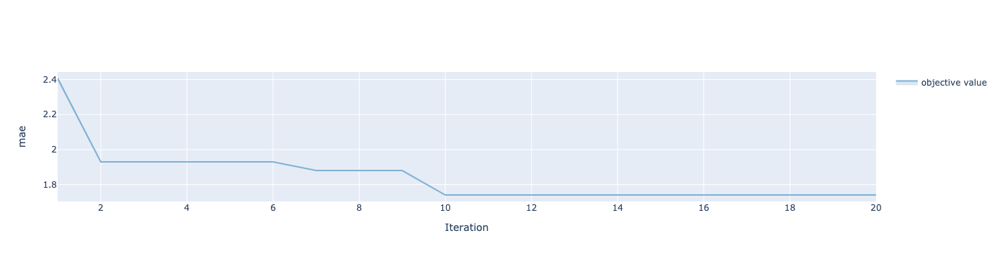

In [15]:
from ax.plot.trace import optimization_trace_single_method

best_objectives = np.array([[trial.objective_mean for trial in exp.trials.values()]])
best_objective_plot = optimization_trace_single_method(
    y=np.minimum.accumulate(best_objectives, axis=1), ylabel="mae",
)
render(best_objective_plot)

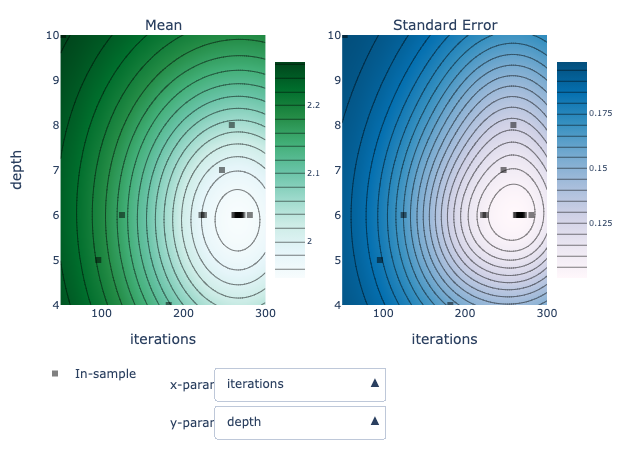

In [16]:
from ax.plot.contour import interact_contour

render(interact_contour(model=gpei, metric_name="mae"))

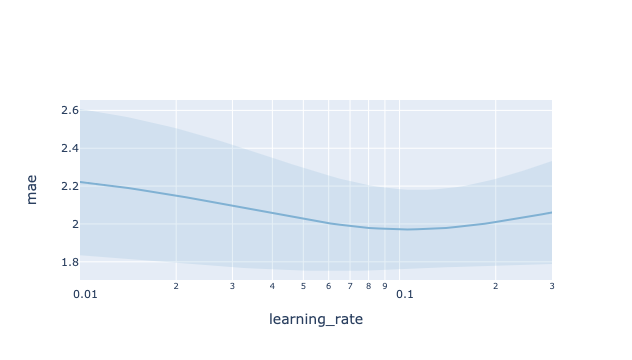

In [17]:
from ax.plot.slice import plot_slice

# パラメータ 1 つ選択してスコアの期待値と標準偏差を表したグラフ
render(plot_slice(gpei, "learning_rate", "mae"))